In [1]:
# Convert SEGY to XARRAY (.seisnc)

# copy the sgy file to data folder and then run the following

!python /local1/workspace/seismic_image_enhancement/utils/segy_input.py -i 'Netherlands_F3_raw.sgy'

Copy the .sgy file to /dat folder and input only the filename Ex : Netherlands_f3.sgy 
Input SEGY Path : /local1/workspace/seismic_image_enhancement/data/Netherlands_F3_raw.sgy
SEGY folder already exists
/local1/workspace/seismic_image_enhancement/data/netherlands_f3_raw/Netherlands_F3_raw.sgy
SEGY already copied to SEGY folder
/home/hwjayb/.local/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 34264 instead
  warnings.warn(
seisnc already exists
Global Statistics already exists
Patches information already exists


In [2]:
import sys 
sys.path.append('../config')
sys.path.append('../utils')

import numpy as np

import gc

import matplotlib.pyplot as plt 

from segy_input import get_config, derive_seisnc_path, open_seisnc, get_global_stats

/home/hwjayb/.local/lib/python3.9/site-packages/segysak/segy/_segy_core.py:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [3]:
# add noises to .seisnc and create new seisnc

CONFIG_PATH = '/local1/workspace/seismic_image_enhancement/config/config_dncnn.yaml'
config = get_config(CONFIG_PATH)
config


{'dir': {'workspace': '/local1/workspace/seismic_image_enhancement/',
  'data': 'data',
  'train_patch_info': 'train_patches_info_$$stride$$.csv',
  'test_patch_info': 'test_patches_info_$$stride$$.csv',
  'val_patch_info': 'val_patches_info_$$stride$$.csv',
  'all_patch_info': 'patches_info_$$stride$$.csv',
  'mute_mask_info': 'mute_info.csv',
  'global_stats': 'global_stats.h5',
  'logs': 'lightning_logs',
  'logs_subdir': 'dncnn',
  'results': '/results/dncnn'},
 'byte_locations': {'INLINE_3D': 189,
  'CROSSLINE_3D': 193,
  'CDP_X': 181,
  'CDP_Y': 185,
  'MUTE_START': 111,
  'MUTE_END': 113},
 'patch_based_training': {'patch_size': 512,
  'stride': 512,
  'batch_size': 1,
  'noise_factors': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
  'noise_modes': ['gaussian', 'poisson'],
  'split_factor': [0.8, 0.1, 0.1]},
 'dncnn': {'num_layers': 12, 'mask_width': 4, 'learning_rate': [0.001, 0.01]}}

In [4]:
noise_factors = config['patch_based_training']['noise_factors']
noise_modes = config['patch_based_training']['noise_modes']



In [5]:
# starting a dask client
from dask.distributed import Client 
client = Client()

# print client details
client 

/home/hwjayb/.local/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 34414 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:34414/status,
Dashboard: http://127.0.0.1:34414/status,Workers: 11
Total threads: 88,Total memory: 251.66 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:40842,Workers: 11
Dashboard: http://127.0.0.1:34414/status,Total threads: 88
Started: Just now,Total memory: 251.66 GiB
Comm: tcp://127.0.0.1:42418,Total threads: 8
Dashboard: http://127.0.0.1:37406/status,Memory: 22.88 GiB
Nanny: tcp://127.0.0.1:33165,


In [6]:
# open clean seisnc

segy_filename = 'Netherlands_F3_raw.sgy'
seisnc_path = derive_seisnc_path(segy_filename, CONFIG_PATH)
clean_seisnc = open_seisnc(seisnc_path, chunks = {"iline" : 100})


In [7]:
# read global stats 
mean,std,abs_max = get_global_stats(segy_filename, CONFIG_PATH)
mean, std, abs_max

(-2.0114691, 2444.9863, 8649.39)

In [8]:
# add gaussian noise 
from skimage.util import random_noise

def add_noise(data, mode, mean,noise_factor) : 
    args = dict(mode = mode, seed=42, clip=True, mean =mean , var = noise_factor)
    return random_noise(data, **args)

In [9]:
# generate data with AWGN at all noise levels

noise_mode = 'gaussian'
for level in noise_factors : 
    # clip , normalise, add noise , denormalise

    n_seisnc = clean_seisnc.clip(-abs_max, abs_max) / abs_max # clip first
    n_seisnc = abs_max * n_seisnc.map(add_noise, args=(noise_mode,0,level) )

    # write noisy data to new seisnc
    seisnc_path_new = seisnc_path.split('.seisnc')[0] + '_' + noise_mode + '_' + str(level) + '.seisnc'
    n_seisnc.to_netcdf(seisnc_path_new, format='NETCDF4', engine='netcdf4', compute=True)
    gc.collect()

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 1:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 1:
  #000: H5A.c line 528 in H5Ao

In [18]:
# generate data with mixed AWGN levels 
noise_mode = 'gaussian'


def add_mixed_noise(data, mode, mean,noise_factor) : 
    args = dict(mode = mode, seed=42, clip=True, mean =mean , var = noise_factor)
    return random_noise(data, **args)


def noise_pipeline(iline, mode, mean, noise_factors, abs_max) : 
    iline_norm = iline.clip(-abs_max, abs_max) / abs_max # clip first
    noise_factor = np.random.choice(noise_factors)
    iline_noisy_norm = iline_norm.map(add_mixed_noise, args=( mode, mean, noise_factor))
    iline_noisy_denorm = abs_max * iline_noisy_norm
    return iline_noisy_denorm

mixed_n_seisnc = clean_seisnc.groupby('iline').map(noise_pipeline, args=(noise_mode,0,noise_factors, abs_max) )


# write noisy data to new seisnc
seisnc_path_new = seisnc_path.split('.seisnc')[0] + '_' + noise_mode + '_mixed.seisnc'
mixed_n_seisnc.to_netcdf(seisnc_path_new, format='NETCDF4', engine='netcdf4', compute=True)
gc.collect()

PermissionError: [Errno 13] Permission denied: b'/local1/workspace/seismic_image_enhancement/data/netherlands_f3_raw/Netherlands_F3_raw_gaussian_mixed.seisnc'

In [ ]:
# sanity checks 

from glob import glob 

seisnc_folderpath = '/'.join(derive_seisnc_path(segy_filename, CONFIG_PATH).split('/')[:-1])
seisnc_file_paths = glob(seisnc_folderpath + '/*.seisnc')
len(seisnc_file_paths)

['/local1/workspace/seismic_image_enhancement/data/netherlands_f3_raw/Netherlands_F3_raw.seisnc',
 '/local1/workspace/seismic_image_enhancement/data/netherlands_f3_raw/Netherlands_F3_raw_gaussian_0.1.seisnc',
 '/local1/workspace/seismic_image_enhancement/data/netherlands_f3_raw/Netherlands_F3_raw_gaussian_0.2.seisnc',
 '/local1/workspace/seismic_image_enhancement/data/netherlands_f3_raw/Netherlands_F3_raw_gaussian_0.3.seisnc',
 '/local1/workspace/seismic_image_enhancement/data/netherlands_f3_raw/Netherlands_F3_raw_gaussian_0.4.seisnc',
 '/local1/workspace/seismic_image_enhancement/data/netherlands_f3_raw/Netherlands_F3_raw_gaussian_0.5.seisnc',
 '/local1/workspace/seismic_image_enhancement/data/netherlands_f3_raw/Netherlands_F3_raw_gaussian_0.6.seisnc',
 '/local1/workspace/seismic_image_enhancement/data/netherlands_f3_raw/Netherlands_F3_raw_gaussian_0.7.seisnc',
 '/local1/workspace/seismic_image_enhancement/data/netherlands_f3_raw/Netherlands_F3_raw_gaussian_0.8.seisnc',
 '/local1/work

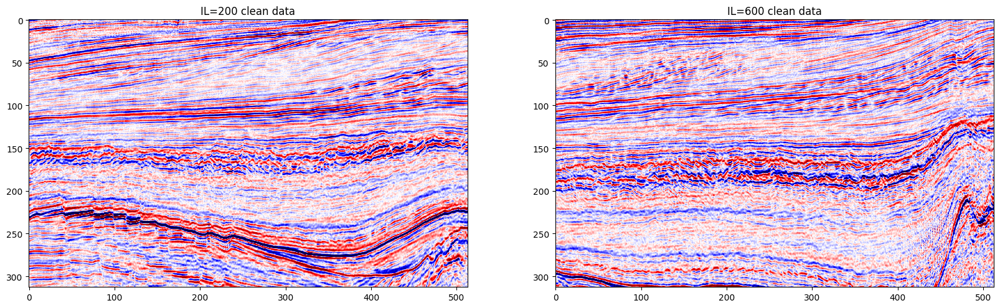

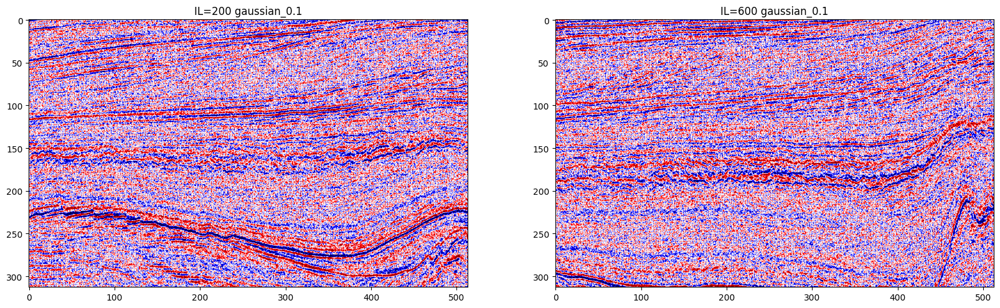

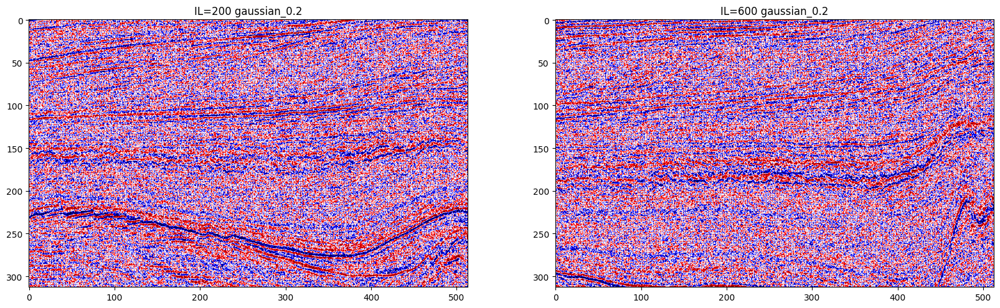

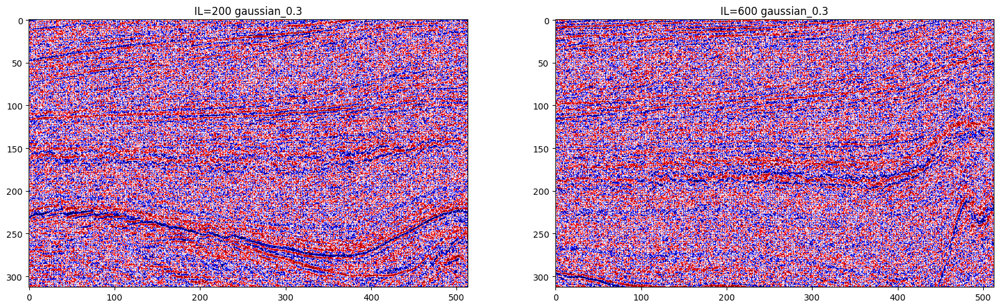

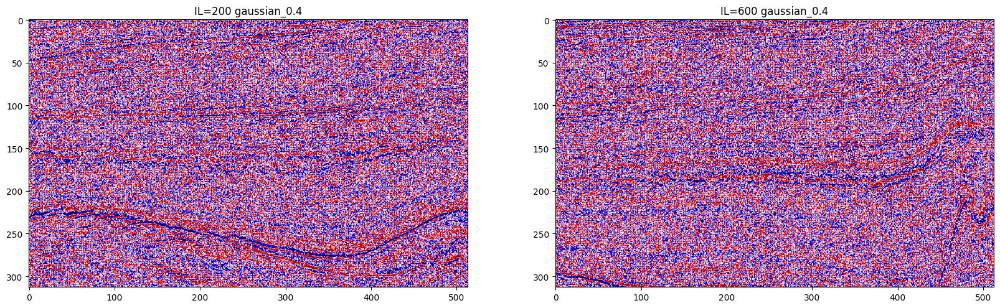

...

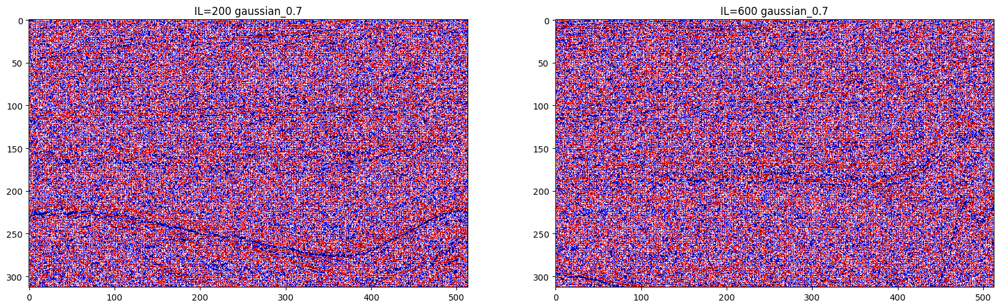

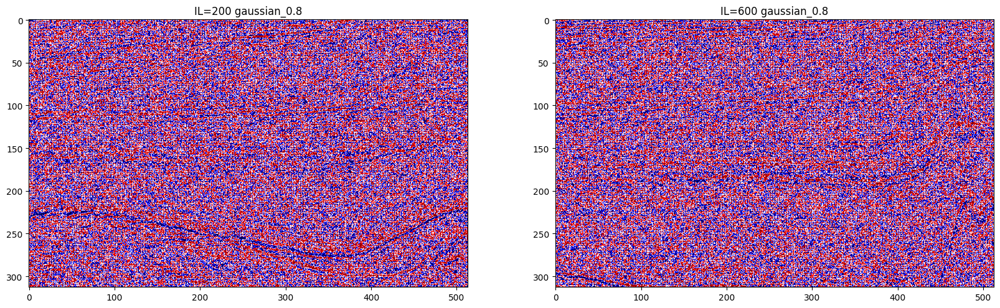

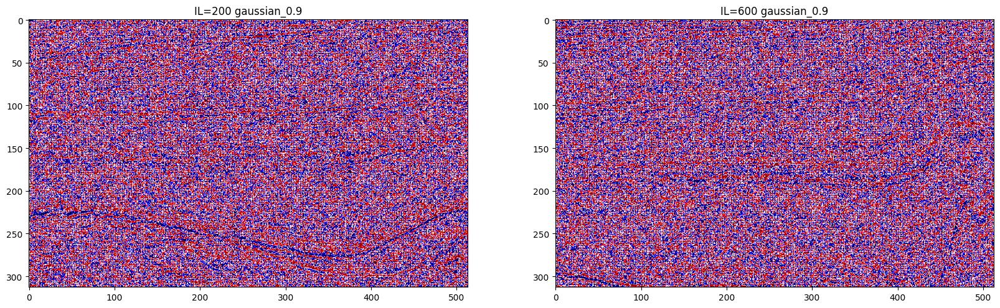

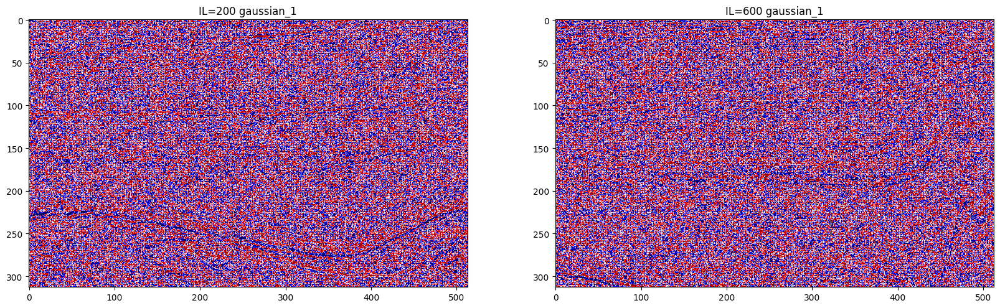

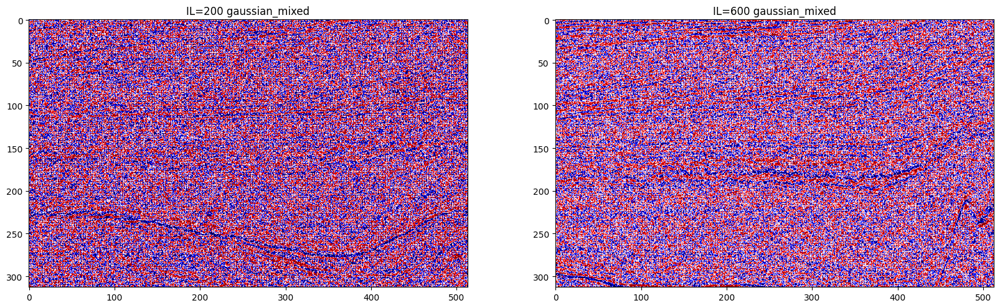

In [ ]:
seisnc_files = list(map(lambda x : open_seisnc(x), seisnc_file_paths))
for i in range(len(seisnc_file_paths)) : 
    ilines = [200, 600]
    xlines = [400,700]
    twts = [600.0, 600.0 + 512.0 * 2]
    x = seisnc_files[i].sel(iline = ilines[0],xline = slice(xlines[0],xlines[0] + 512),twt=slice(twts[0] , twts[0] + 512.0 * 4)).transpose('twt','xline')
    y = seisnc_files[i].sel(iline = ilines[1],xline = slice(xlines[1],xlines[1] + 512),twt=slice(twts[0] , twts[0]  + 512.0 * 4)).transpose('twt','xline')

    title = ''
    if i == 0 : 
        title = f'clean data'
    if i > 0 : 
        title ='gaussian_' + seisnc_file_paths[i].split('.seisnc')[0].split('_')[-1]

    fig, ax = plt.subplots(ncols=2, figsize=(20,10))

    ax[0].imshow(x.data, cmap='seismic', vmin=-abs_max, vmax=abs_max)
    ax[0].set_title(f"IL={ilines[0]} " + title )
    ax[1].imshow(y.data, cmap='seismic', vmin=-abs_max, vmax=abs_max)
    ax[1].set_title(f"IL={ilines[1]} " + title )
    # plt.hist(x.data, bins=100)
    # plt.axis('off')
plt.show()